In [1]:
import os
import math
import glob
import torch
import random
import numpy as np
import pandas as pd
import torch.nn as nn
from PIL import Image
from tqdm.auto import tqdm
from torch.optim import Adam
from torchinfo import summary
from torchvision.transforms import v2
from torch.utils.data import Dataset, DataLoader
from torchmetrics.image import PeakSignalNoiseRatio
from torch.optim.lr_scheduler import StepLR
from torchmetrics.image import StructuralSimilarityIndexMeasure
from torchmetrics.image.lpip import LearnedPerceptualImagePatchSimilarity

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
HR_train_paths = sorted(glob.glob("../data/DIV2K_train_HR/*.png"))
X2_train_paths = sorted(glob.glob("../data/DIV2K_train_LR_bicubic/X2/*.png"))
X4_train_paths = sorted(glob.glob("../data/DIV2K_train_LR_bicubic/X4/*.png"))
X8_train_paths = sorted(glob.glob("../data/DIV2K_train_LR_bicubic/X8/*.png"))
X16_train_paths = sorted(glob.glob("../data/DIV2K_train_LR_bicubic/X16/*.png"))
X32_train_paths = sorted(glob.glob("../data/DIV2K_train_LR_bicubic/X32/*.png"))
X64_train_paths = sorted(glob.glob("../data/DIV2K_train_LR_bicubic/X64/*.png"))

HR_valid_paths = sorted(glob.glob("../data/DIV2K_valid_HR/*.png"))
X2_valid_paths = sorted(glob.glob("../data/DIV2K_valid_LR_bicubic/X2/*.png"))
X4_valid_paths = sorted(glob.glob("../data/DIV2K_valid_LR_bicubic/X4/*.png"))
X8_valid_paths = sorted(glob.glob("../data/DIV2K_valid_LR_bicubic/X8/*.png"))
X16_valid_paths = sorted(glob.glob("../data/DIV2K_valid_LR_bicubic/X16/*.png"))
X32_valid_paths = sorted(glob.glob("../data/DIV2K_valid_LR_bicubic/X32/*.png"))
X64_valid_paths = sorted(glob.glob("../data/DIV2K_valid_LR_bicubic/X64/*.png"))

## Model and data preparation

## SRResNet

The architecture below is described in this [paper](https://arxiv.org/pdf/1609.04802)

In [4]:
class ResBlock(nn.Module):
        def __init__(self):
            super().__init__()
            self.block = nn.Sequential(
                nn.Conv2d(64, 64, 3, stride=1, padding='same'),
                nn.BatchNorm2d(64),
                nn.PReLU(),
                nn.Conv2d(64, 64, 3, stride=1, padding='same'),
                nn.BatchNorm2d(64)
            )

        def forward(self, x):
            return x + self.block(x)

class SRResNet(nn.Module):
    def __init__(self, n: int):
        """
        Args:
            n: scaling factor
        """
        super().__init__()
        
        self.expand = nn.Sequential(
            nn.Conv2d(3, 64, 9, stride=1, padding='same'),
            nn.PReLU()
        )

        self.residual_blocks = nn.Sequential()
        for _ in range(16):
            self.residual_blocks.append(ResBlock())

        self.residual_blocks.append(nn.Conv2d(64, 64, 3, stride=1, padding='same'))
        self.residual_blocks.append(nn.BatchNorm2d(64))

        self.upscaling_head = nn.Sequential()
        for _ in range(int(math.log2(n))):
            self.upscaling_head.append(nn.Conv2d(64, 256, 3, stride=1, padding='same'))
            self.upscaling_head.append(nn.PixelShuffle(2))
            self.upscaling_head.append(nn.PReLU())
            
        self.upscaling_head.append(nn.Conv2d(64, 3, 9, stride=1, padding='same'))

    def forward(self, x):
        x = self.expand(x)
        return self.upscaling_head(self.residual_blocks(x) + x)

In [5]:
summary(SRResNet(8), input_size=(16, 3, 48, 48))

Layer (type:depth-idx)                   Output Shape              Param #
SRResNet                                 [16, 3, 384, 384]         --
├─Sequential: 1-1                        [16, 64, 48, 48]          --
│    └─Conv2d: 2-1                       [16, 64, 48, 48]          15,616
│    └─PReLU: 2-2                        [16, 64, 48, 48]          1
├─Sequential: 1-2                        [16, 64, 48, 48]          --
│    └─ResBlock: 2-3                     [16, 64, 48, 48]          --
│    │    └─Sequential: 3-1              [16, 64, 48, 48]          74,113
│    └─ResBlock: 2-4                     [16, 64, 48, 48]          --
│    │    └─Sequential: 3-2              [16, 64, 48, 48]          74,113
│    └─ResBlock: 2-5                     [16, 64, 48, 48]          --
│    │    └─Sequential: 3-3              [16, 64, 48, 48]          74,113
│    └─ResBlock: 2-6                     [16, 64, 48, 48]          --
│    │    └─Sequential: 3-4              [16, 64, 48, 48]          74,

In [5]:
class SRResNet_Dataset(Dataset):
    def __init__(self, target_paths: list[str], scale: int, ram_limit_gb: float = 2.0):
        self.crop_size = scale * 48
        self.scale = scale

        self.input_transform = v2.Compose([
            v2.PILToTensor(),
            v2.Lambda(lambda x: x / 255.0)
        ])
        
        self.target_transform = v2.Compose([
            v2.PILToTensor(),
            v2.Lambda(lambda x: (2.0*x / 255.0) - 1)
        ])

        self.preloaded = {}
        self.paths = target_paths

        total_ram_used = 0
        for i, path in enumerate(tqdm(target_paths, desc="Preloading images")):
            img = Image.open(path).convert("RGB")
            total_ram_used += img.width * img.height * 3 / (1024 ** 3)  # ~size in GB

            if total_ram_used < ram_limit_gb:
                self.preloaded[i] = img
            else:
                break

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        if idx in self.preloaded:
            target = self.preloaded[idx]
        else:
            target = Image.open(self.paths[idx]).convert("RGB")

        target = self.random_crop(target, self.crop_size)
        inp = target.resize((target.width // self.scale, target.height // self.scale), Image.BICUBIC)
            
        return self.input_transform(inp), self.target_transform(target)

    def random_crop(self, img, size):
        w, h = img.size
        if w < size or h < size:
            img = img.resize((size, size), Image.BICUBIC)
        x = random.randint(0, w - size)
        y = random.randint(0, h - size)
        return img.crop((x, y, x + size, y + size))

    def set_scale(self, scale: int):
        self.scale = scale

    def set_crop_size(self, crop_size: int):
        self.crop_size = crop_size

In [6]:
psnr = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)
lpips = LearnedPerceptualImagePatchSimilarity(normalize=True).to(device)

In [7]:
transform = v2.Compose([
    v2.PILToTensor(),
    v2.Lambda(lambda x: x / 255.0)
])

In [8]:
def calc_metrics(model: nn.Module, target_ds: list[str], scale: int):
    transform = v2.Compose([
        v2.PILToTensor(),
        v2.Lambda(lambda x: x / 255.0)
    ])

    psnr_acc = 0
    ssim_acc = 0
    lpips_acc = 0
    failed_lpips = 0

    for i in tqdm(range(len(target_ds)), leave=False):
        target_image = Image.open(target_ds[i]).convert("RGB")
        w, h = target_image.size

        w -= w % scale
        h -= h % scale
        target_image = target_image.crop((0, 0, w, h))
        
        lowres = target_image.resize((w // scale, h // scale), resample=Image.BICUBIC)
        input_tensor = transform(lowres).unsqueeze(0).to(device)
        target_tensor = transform(target_image).unsqueeze(0).to(device)

        with torch.inference_mode():
            # convert value range [-1,1] -> [0,1]
            sr = ((model(input_tensor)+1.0)/2.0).clamp(0.0, 1.0)

        psnr_acc += psnr(sr, target_tensor).item()
        ssim_acc += ssim(sr, target_tensor).item()
        
        # There are 2 images that cause lpips to fail
        try:
            x = lpips(sr, target_tensor).cpu().item()
            if np.isnan(x):
                failed_lpips += 1
                continue
                
            lpips_acc += x
        except:
            failed_lpips += 1

    lpips_acc /= len(target_ds) - failed_lpips
    psnr_acc /= len(target_ds)
    ssim_acc /= len(target_ds)
    return psnr_acc, ssim_acc, lpips_acc

In [9]:
def train_step(model, dataloader, optimizer, loss_fn):
    avg_psnr = 0
    avg_ssim = 0
    model.train()

    for batch, target in dataloader:
        batch, target = batch.to(device), target.to(device)
        
        logits = model(batch)
        loss = loss_fn(logits, target)

        loss.backward()
        optimizer.step()
        optimizer.zero_grad(set_to_none=True)

        # convert value range [-1,1] -> [0,1]
        logits = ((logits+1.0)/2.0).clamp(0.0, 1.0)
        target = ((target+1.0)/2.0).clamp(0.0, 1.0)
        
        avg_psnr += psnr(logits, target).item()
        avg_ssim += ssim(logits, target).item()
        
    avg_psnr /= len(dataloader)
    avg_ssim /= len(dataloader)
    return avg_psnr, avg_ssim

def valid_step(model, dataloader, loss_fn):
    avg_psnr = 0
    avg_ssim = 0
    avg_lpips = 0
    model.eval()

    with torch.inference_mode():
        for batch, target in dataloader:
            batch, target = batch.to(device), target.to(device)

            # convert [-1,1] -> [0,1]
            logits = ((model(batch)+1.0)/2.0).clamp(0.0, 1.0)
            target = ((target+1.0)/2.0).clamp(0.0, 1.0)
            
            avg_psnr += psnr(logits, target).item()
            avg_ssim += ssim(logits, target).item()
            avg_lpips += lpips(logits, target).item()

    avg_psnr /= len(dataloader)
    avg_ssim /= len(dataloader)
    avg_lpips /= len(dataloader)

        
    return avg_psnr, avg_ssim, avg_lpips

In [10]:
def train(model, train_dl, valid_dl, optimizer, loss_fn, epochs, start_checkpoint=None):
    os.makedirs('../tmp_model_checkpoints', exist_ok=True)
    counter = 0 # count epochs without printing training stats
    
    if start_checkpoint:
        start_epoch = start_checkpoint['epoch'] + 1
        best_psnr = start_checkpoint['best_psnr']
        best_ssim = start_checkpoint['best_ssim']
        best_lpips = start_checkpoint['best_lpips']
    else:
        start_epoch = 0
        best_psnr = 0
        best_ssim = 0
        best_lpips = float('inf')
        
    log_freq = (epochs - start_epoch) // 100 # how often to print stats when no progress is made
    
    for epoch in tqdm(range(start_epoch, epochs), desc="Epochs"):
        counter += 1
        train_psnr, train_ssim = train_step(
            model,
            train_dl,
            optimizer,
            loss_fn
        )

        valid_psnr, valid_ssim, valid_lpips = valid_step(
            model,
            valid_dl,
            loss_fn,
        )

        progress = False
        
        if valid_psnr > best_psnr:
            progress = True
            best_psnr = valid_psnr
            checkpoint = {
                'epoch': epoch,
                'best_psnr': best_psnr,
                'best_ssim': best_ssim,
                'best_lpips': best_lpips,
                'model_state_dict':  model._orig_mod.state_dict(),
                'optimizer_state_dict': optimizer.state_dict()
            }
            torch.save(checkpoint, f'../tmp_model_checkpoints/best_psnr.pth')

        if valid_ssim > best_ssim:
            progress = True
            best_ssim = valid_ssim
            checkpoint = {
                'epoch': epoch,
                'best_psnr': best_psnr,
                'best_ssim': best_ssim,
                'best_lpips': best_lpips,
                'model_state_dict':  model._orig_mod.state_dict(),
                'optimizer_state_dict': optimizer.state_dict()
            }
            torch.save(checkpoint, f'../tmp_model_checkpoints/best_ssim.pth')

        if valid_lpips < best_lpips:
            progress = True
            best_lpips = valid_lpips
            checkpoint = {
                'epoch': epoch,
                'best_psnr': best_psnr,
                'best_ssim': best_ssim,
                'best_lpips': best_lpips,
                'model_state_dict':  model._orig_mod.state_dict(),
                'optimizer_state_dict': optimizer.state_dict()
            }
            torch.save(checkpoint, f'../tmp_model_checkpoints/best_lpips.pth')

        if epoch == epochs-1:
            checkpoint = {
                'epoch': epoch,
                'best_psnr': best_psnr,
                'best_ssim': best_ssim,
                'best_lpips': best_lpips,
                'model_state_dict':  model._orig_mod.state_dict(),
                'optimizer_state_dict': optimizer.state_dict()
            }
            torch.save(checkpoint, f'../tmp_model_checkpoints/last.pth')
            
        if progress or counter >= log_freq:
            counter = 0
            print(
                f"Epoch: {epoch+1} | "
                f"[train] PSNR: {train_psnr:.4f} | "
                f"[train] SSIM: {train_ssim:.4f} | "
                f"[valid] PSNR: {valid_psnr:.4f} | "
                f"[valid] SSIM: {valid_ssim:.4f} | "
                f"[valid] LPIPS: {valid_lpips:.4f}"
            )

## X2 Scaling

### Training

In [11]:
valid_ds = SRResNet_Dataset(HR_valid_paths, 2, ram_limit_gb=1)

Preloading images:   0%|          | 0/100 [00:00<?, ?it/s]

In [12]:
train_ds = SRResNet_Dataset(HR_train_paths, 2, ram_limit_gb=8)

Preloading images:   0%|          | 0/800 [00:00<?, ?it/s]

In total there will be 20000 epochs, I will split it into 4 days

### Day 1

In [13]:
train_dl = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=os.cpu_count()-1)
valid_dl = DataLoader(valid_ds, batch_size=16, shuffle=False, num_workers=os.cpu_count()-1)

model = torch.compile(SRResNet(2).to(device))
loss_fn = nn.L1Loss()
optimizer = Adam(model.parameters(), lr=1e-4)

train(model, train_dl, valid_dl, optimizer, loss_fn, 5000)

Epochs:   0%|          | 0/5000 [00:00<?, ?it/s]

W0414 07:35:55.159000 2779 torch/_inductor/utils.py:1137] [0/0] Not enough SMs to use max_autotune_gemm mode


Epoch: 1 | [train] PSNR: 18.0445 | [train] SSIM: 0.3753 | [valid] PSNR: 18.9565 | [valid] SSIM: 0.4741 | [valid] LPIPS: 0.5914
Epoch: 2 | [train] PSNR: 19.6647 | [train] SSIM: 0.5198 | [valid] PSNR: 22.6682 | [valid] SSIM: 0.5802 | [valid] LPIPS: 0.4300
Epoch: 3 | [train] PSNR: 20.0518 | [train] SSIM: 0.5699 | [valid] PSNR: 20.7418 | [valid] SSIM: 0.5583 | [valid] LPIPS: 0.4168
Epoch: 4 | [train] PSNR: 20.9813 | [train] SSIM: 0.6090 | [valid] PSNR: 21.5780 | [valid] SSIM: 0.6535 | [valid] LPIPS: 0.3514
Epoch: 6 | [train] PSNR: 21.4638 | [train] SSIM: 0.6535 | [valid] PSNR: 22.0963 | [valid] SSIM: 0.6470 | [valid] LPIPS: 0.3257
Epoch: 7 | [train] PSNR: 21.5994 | [train] SSIM: 0.6652 | [valid] PSNR: 23.2701 | [valid] SSIM: 0.6756 | [valid] LPIPS: 0.3295
Epoch: 8 | [train] PSNR: 22.4024 | [train] SSIM: 0.6871 | [valid] PSNR: 23.2416 | [valid] SSIM: 0.6837 | [valid] LPIPS: 0.3139
Epoch: 9 | [train] PSNR: 22.8542 | [train] SSIM: 0.7066 | [valid] PSNR: 25.0106 | [valid] SSIM: 0.7145 | [valid

In [37]:
checkpoint = torch.load('../model_checkpoints/SRResNet/X2.pth')
model = SRResNet(2).to(device)
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [38]:
model.eval();

In [39]:
targets = [X32_valid_paths, X16_valid_paths, X8_valid_paths, X4_valid_paths, X2_valid_paths, HR_valid_paths]

metrics_x2 = pd.DataFrame(columns=["PSNR↑", "SSIM↑", "LPIPS↓"])
for target_ds in tqdm(targets, total=6):
    metrics_x2.loc[len(metrics_x2)] = calc_metrics(model, target_ds, 2)

metrics_x2.index = [
    "31px -> 62px", "63px -> 126px", "127px -> 254px", 
    "255px -> 510px", "510px -> 1020px", "1020px -> 2040px"
]
metrics_x2

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

,PSNR↑,SSIM↑,LPIPS↓
31px -> 62px,26.474818,0.873463,0.054421
63px -> 126px,27.672256,0.889680,0.079834
127px -> 254px,29.417414,0.912687,0.081506
255px -> 510px,30.967512,0.923468,0.078767
510px -> 1020px,32.876358,0.934969,0.075938
1020px -> 2040px,34.195776,0.933932,0.088148


#### Super-resolution showcase

31px -> 62px


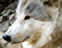

In [40]:
print("31px -> 62px")
inp = transform(Image.open(X64_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/31px', exist_ok=True)
img.save('../image_results/2X/31px/SRResNet_31px.png')
img

63px -> 126px


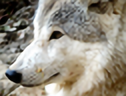

In [41]:
print("63px -> 126px")
inp = transform(Image.open(X32_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/63px', exist_ok=True)
img.save('../image_results/2X/63px/SRResNet_63px.png')
img

127px -> 254px


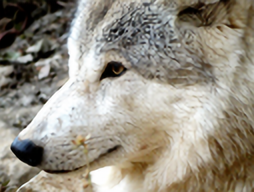

In [42]:
print("127px -> 254px")
inp = transform(Image.open(X16_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/127px', exist_ok=True)
img.save('../image_results/2X/127px/SRResNet_127px.png')
img

255px -> 510px


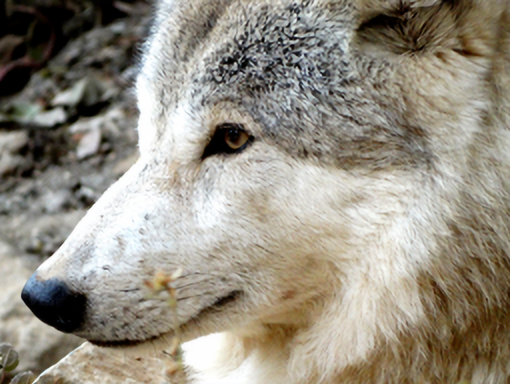

In [43]:
print("255px -> 510px")
inp = transform(Image.open(X8_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/255px', exist_ok=True)
img.save('../image_results/2X/255px/SRResNet_255px.png')
img

510px -> 1020px


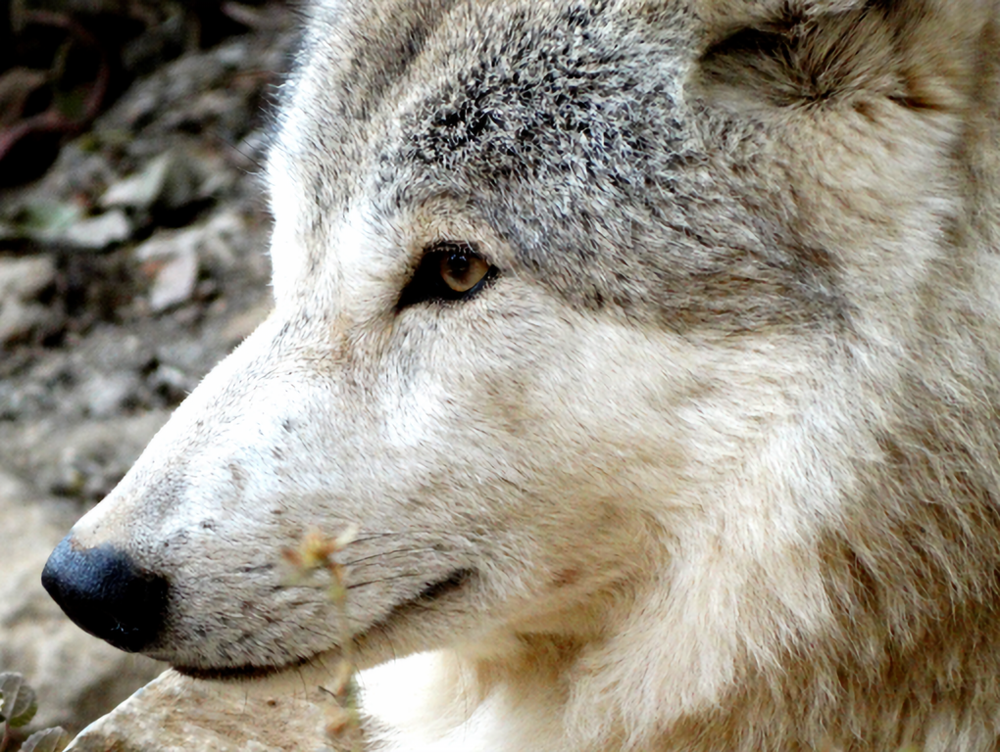

In [44]:
print("510px -> 1020px")
inp = transform(Image.open(X4_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/510px', exist_ok=True)
img.save('../image_results/2X/510px/SRResNet_510px.png')
img

1020px -> 2040px


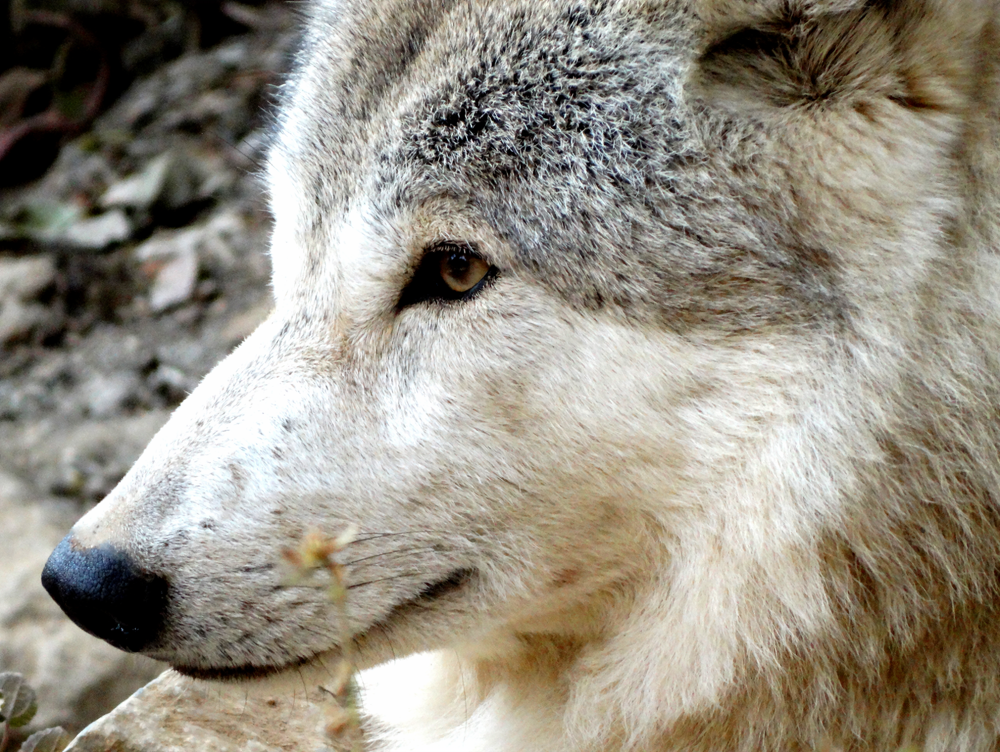

In [45]:
print("1020px -> 2040px")
inp = transform(Image.open(X2_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/1020px', exist_ok=True)
img.save('../image_results/2X/1020px/SRResNet_1020px.png')
img

### Day 2

In [13]:
train_dl = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=os.cpu_count()-1)
valid_dl = DataLoader(valid_ds, batch_size=16, shuffle=False, num_workers=os.cpu_count()-1)

checkpoint = torch.load('../tmp_model_checkpoints/last.pth')
model = SRResNet(2).to(device)
loss_fn = nn.L1Loss()
optimizer = Adam(model.parameters(), lr=1e-4)

model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

model = torch.compile(model)

train(model, train_dl, valid_dl, optimizer, loss_fn, 10000, start_checkpoint=checkpoint)

Epochs:   0%|          | 0/5000 [00:00<?, ?it/s]

Epoch: 5050 | learning rate: 0.000050 | [train] PSNR: 31.4867 | [train] SSIM: 0.9338 | [valid] PSNR: 31.9972 | [valid] SSIM: 0.9390 | [valid] LPIPS: 0.0563
Epoch: 5100 | learning rate: 0.000050 | [train] PSNR: 32.7758 | [train] SSIM: 0.9402 | [valid] PSNR: 32.5059 | [valid] SSIM: 0.9405 | [valid] LPIPS: 0.0509
Epoch: 5150 | learning rate: 0.000050 | [train] PSNR: 32.0826 | [train] SSIM: 0.9357 | [valid] PSNR: 32.9015 | [valid] SSIM: 0.9354 | [valid] LPIPS: 0.0552
Epoch: 5200 | learning rate: 0.000050 | [train] PSNR: 31.7305 | [train] SSIM: 0.9360 | [valid] PSNR: 32.5693 | [valid] SSIM: 0.9331 | [valid] LPIPS: 0.0644
Epoch: 5201 | learning rate: 0.000050 | [train] PSNR: 31.8953 | [train] SSIM: 0.9352 | [valid] PSNR: 33.9781 | [valid] SSIM: 0.9422 | [valid] LPIPS: 0.0567
Epoch: 5251 | learning rate: 0.000050 | [train] PSNR: 31.9982 | [train] SSIM: 0.9345 | [valid] PSNR: 31.8491 | [valid] SSIM: 0.9298 | [valid] LPIPS: 0.0625
Epoch: 5301 | learning rate: 0.000050 | [train] PSNR: 32.0852 | 

In [15]:
checkpoint = torch.load('../model_checkpoints/SRResNet/X2.pth')
model = SRResNet(2).to(device)
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [16]:
model.eval();

In [42]:
targets = [X32_valid_paths, X16_valid_paths, X8_valid_paths, X4_valid_paths, X2_valid_paths, HR_valid_paths]

metrics_x2 = pd.DataFrame(columns=["PSNR↑", "SSIM↑", "LPIPS↓"])
for target_ds in tqdm(targets, total=6):
    metrics_x2.loc[len(metrics_x2)] = calc_metrics(model, target_ds, 2)

metrics_x2.index = [
    "31px -> 62px", "63px -> 126px", "127px -> 254px", 
    "255px -> 510px", "510px -> 1020px", "1020px -> 2040px"
]
metrics_x2

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

,PSNR↑,SSIM↑,LPIPS↓
31px -> 62px,26.723413,0.881087,0.050307
63px -> 126px,27.962821,0.896895,0.072291
127px -> 254px,29.816207,0.919586,0.074259
255px -> 510px,31.396548,0.929204,0.072766
510px -> 1020px,33.324750,0.939715,0.071474
1020px -> 2040px,34.592502,0.937616,0.085545


#### Super-resolution showcase

31px -> 62px


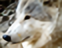

In [18]:
print("31px -> 62px")
inp = transform(Image.open(X64_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/31px', exist_ok=True)
img.save('../image_results/2X/31px/SRResNet_31px.png')
img

63px -> 126px


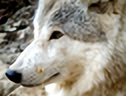

In [19]:
print("63px -> 126px")
inp = transform(Image.open(X32_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/63px', exist_ok=True)
img.save('../image_results/2X/63px/SRResNet_63px.png')
img

127px -> 254px


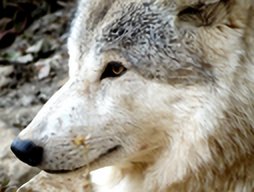

In [20]:
print("127px -> 254px")
inp = transform(Image.open(X16_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/127px', exist_ok=True)
img.save('../image_results/2X/127px/SRResNet_127px.png')
img

255px -> 510px


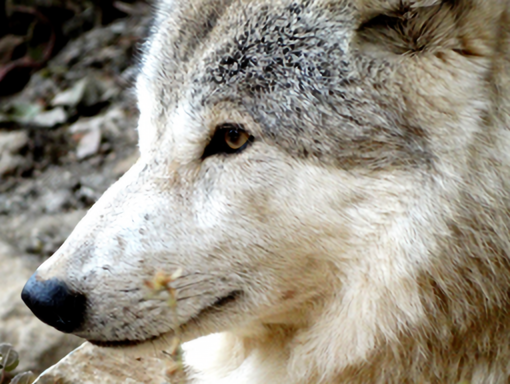

In [21]:
print("255px -> 510px")
inp = transform(Image.open(X8_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/255px', exist_ok=True)
img.save('../image_results/2X/255px/SRResNet_255px.png')
img

510px -> 1020px


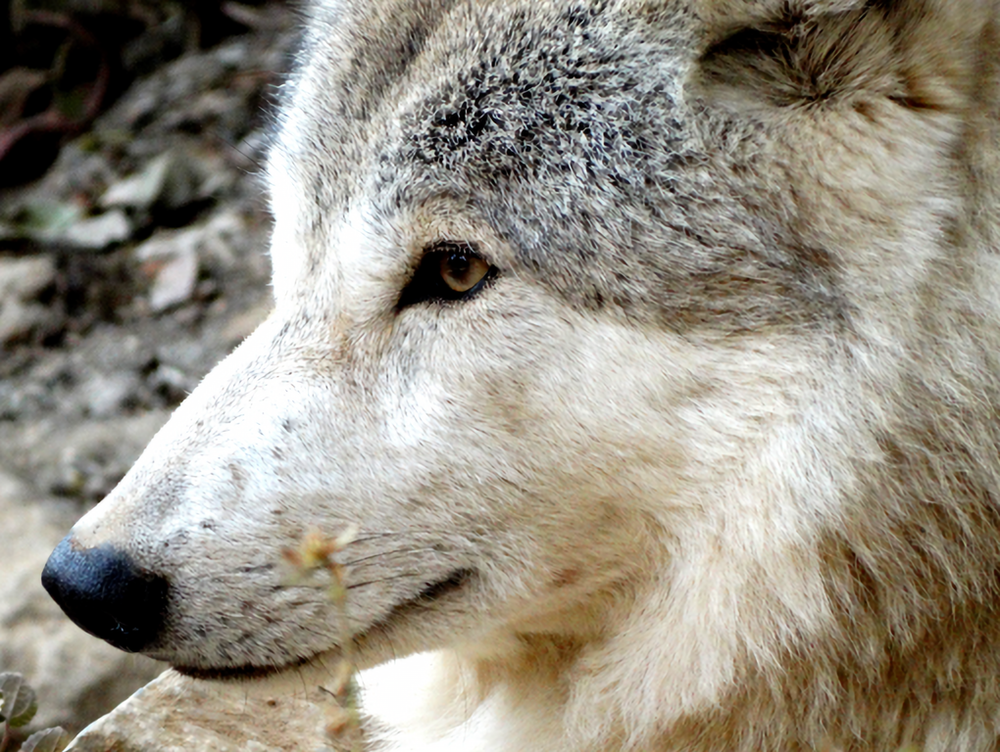

In [22]:
print("510px -> 1020px")
inp = transform(Image.open(X4_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/510px', exist_ok=True)
img.save('../image_results/2X/510px/SRResNet_510px.png')
img

1020px -> 2040px


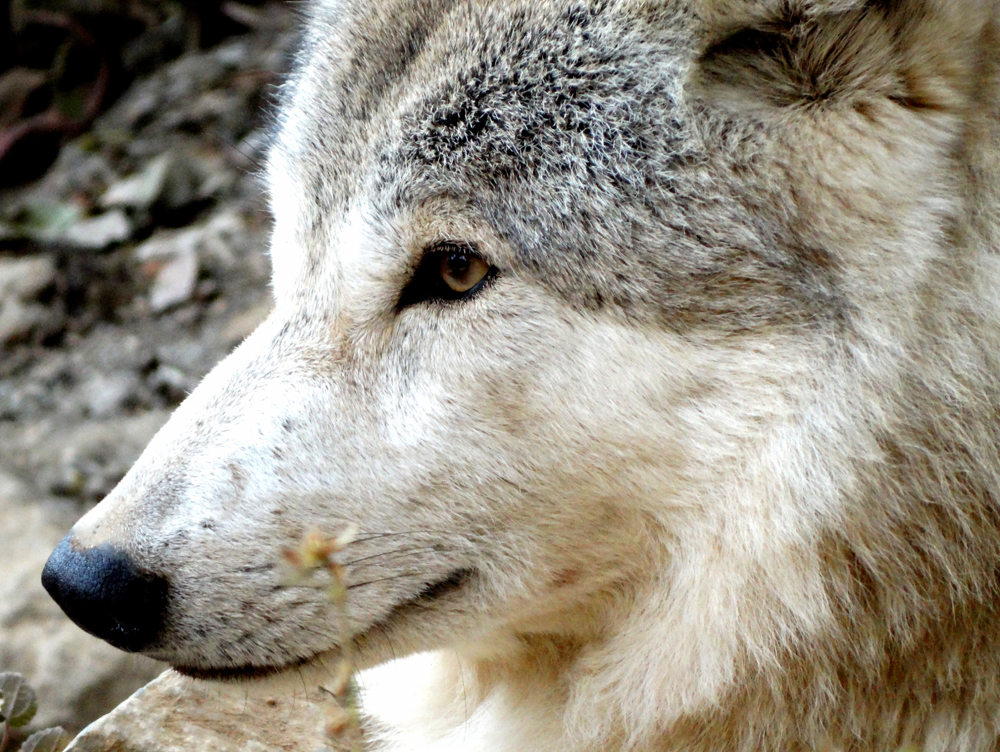

In [23]:
print("1020px -> 2040px")
inp = transform(Image.open(X2_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/1020px', exist_ok=True)
img.save('../image_results/2X/1020px/SRResNet_1020px.png')
img

### Day 3

In [1]:
train_dl = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=os.cpu_count()-1)
valid_dl = DataLoader(valid_ds, batch_size=16, shuffle=False, num_workers=os.cpu_count()-1)

checkpoint = torch.load('../tmp_model_checkpoints/last.pth')
model = SRResNet(2).to(device)
loss_fn = nn.L1Loss()
optimizer = Adam(model.parameters(), lr=1e-4)

model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

model = torch.compile(model)

train(model, train_dl, valid_dl, optimizer, loss_fn, 15000, start_checkpoint=checkpoint)

In [ ]:
model.eval();

In [ ]:
targets = [X32_valid_paths, X16_valid_paths, X8_valid_paths, X4_valid_paths, X2_valid_paths, HR_valid_paths]

metrics_x2 = pd.DataFrame(columns=["PSNR↑", "SSIM↑", "LPIPS↓"])
for target_ds in tqdm(targets, total=6):
    metrics_x2.loc[len(metrics_x2)] = calc_metrics(model, target_ds, 2)

metrics_x2.index = [
    "31px -> 62px", "63px -> 126px", "127px -> 254px", 
    "255px -> 510px", "510px -> 1020px", "1020px -> 2040px"
]
metrics_x2

#### Super-resolution showcase

In [ ]:
print("31px -> 62px")
inp = transform(Image.open(X64_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/31px', exist_ok=True)
img.save('../image_results/2X/31px/SRResNet_31px.png')
img

In [ ]:
print("63px -> 126px")
inp = transform(Image.open(X32_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/63px', exist_ok=True)
img.save('../image_results/2X/63px/SRResNet_63px.png')
img

In [ ]:
print("127px -> 254px")
inp = transform(Image.open(X16_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/127px', exist_ok=True)
img.save('../image_results/2X/127px/SRResNet_127px.png')
img

In [ ]:
print("255px -> 510px")
inp = transform(Image.open(X8_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/255px', exist_ok=True)
img.save('../image_results/2X/255px/SRResNet_255px.png')
img

In [ ]:
print("510px -> 1020px")
inp = transform(Image.open(X4_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/510px', exist_ok=True)
img.save('../image_results/2X/510px/SRResNet_510px.png')
img

In [ ]:
print("1020px -> 2040px")
inp = transform(Image.open(X2_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/1020px', exist_ok=True)
img.save('../image_results/2X/1020px/SRResNet_1020px.png')
img

### Day 4 (final)

In [ ]:
train_dl = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=os.cpu_count()-1)
valid_dl = DataLoader(valid_ds, batch_size=16, shuffle=False, num_workers=os.cpu_count()-1)

checkpoint = torch.load('../tmp_model_checkpoints/last.pth')
model = SRResNet(2).to(device)
loss_fn = nn.L1Loss()
optimizer = Adam(model.parameters(), lr=1e-4)

model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

model = torch.compile(model)

train(model, train_dl, valid_dl, optimizer, loss_fn, 20000, start_checkpoint=checkpoint)

In [ ]:
model.eval();

In [ ]:
targets = [X32_valid_paths, X16_valid_paths, X8_valid_paths, X4_valid_paths, X2_valid_paths, HR_valid_paths]

metrics_x2 = pd.DataFrame(columns=["PSNR↑", "SSIM↑", "LPIPS↓"])
for target_ds in tqdm(targets, total=6):
    metrics_x2.loc[len(metrics_x2)] = calc_metrics(model, target_ds, 2)

metrics_x2.index = [
    "31px -> 62px", "63px -> 126px", "127px -> 254px", 
    "255px -> 510px", "510px -> 1020px", "1020px -> 2040px"
]
metrics_x2

#### Super-resolution showcase

In [ ]:
print("31px -> 62px")
inp = transform(Image.open(X64_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/31px', exist_ok=True)
img.save('../image_results/2X/31px/SRResNet_31px.png')
img

In [ ]:
print("63px -> 126px")
inp = transform(Image.open(X32_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/63px', exist_ok=True)
img.save('../image_results/2X/63px/SRResNet_63px.png')
img

In [ ]:
print("127px -> 254px")
inp = transform(Image.open(X16_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/127px', exist_ok=True)
img.save('../image_results/2X/127px/SRResNet_127px.png')
img

In [ ]:
print("255px -> 510px")
inp = transform(Image.open(X8_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/255px', exist_ok=True)
img.save('../image_results/2X/255px/SRResNet_255px.png')
img

In [ ]:
print("510px -> 1020px")
inp = transform(Image.open(X4_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/510px', exist_ok=True)
img.save('../image_results/2X/510px/SRResNet_510px.png')
img

In [ ]:
print("1020px -> 2040px")
inp = transform(Image.open(X2_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/1020px', exist_ok=True)
img.save('../image_results/2X/1020px/SRResNet_1020px.png')
img